In [4]:
import numpy as np
import torch
import torch.nn as nn
import os, time
from skimage.measure import compare_psnr, compare_ssim
from skimage.io import imread, imsave, imshow

In [5]:
def save_result(result, path):
    path = path if path.find('.') != -1 else path+'.png'
    ext = os.path.splitext(path)[-1]
    if ext in ('.txt', '.dlm'):
        np.savetxt(path, result, fmt='%2.4f')
    else:
        imsave(path, np.clip(result, 0, 1))

def save_residual(r, path):
    path = path if path.find('.') != -1 else path+'.png'
    ext = os.path.splitext(path)[-1]
    
    r = 1.55*(r+0.5)-0.8
    imsave(path, np.clip(r, 0, 1))

def save_structure(s, path):
    path = path if path.find('.') != -1 else path+'.png'
    ext = os.path.splitext(path)[-1]
    
    s = 1.8*(s+0.5)-0.8
    imsave(path, np.clip(s, 0, 1))

def show(x, title=None, cbar=False, figsize=None):
    import matplotlib.pyplot as plt
    plt.figure(figsize=figsize)
    plt.imshow(x, interpolation='nearest', cmap='gray')
    if title:
        plt.title(title)
    if cbar:
        plt.colorbar()
    plt.show()

### Test DNet

     Set12 :     01.png : 0.0100 second


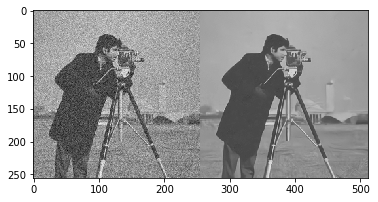

     Set12 :     02.png : 0.0100 second


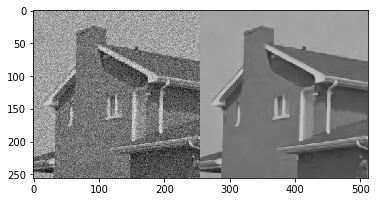

     Set12 :     03.png : 0.0100 second


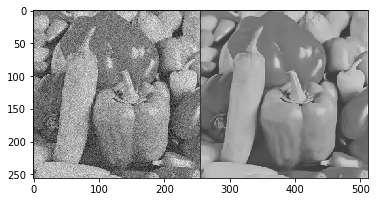

     Set12 :     04.png : 0.0100 second


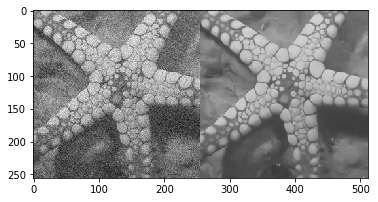

     Set12 :     05.png : 0.0157 second


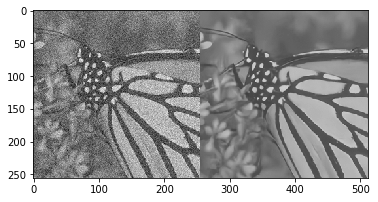

     Set12 :     06.png : 0.0157 second


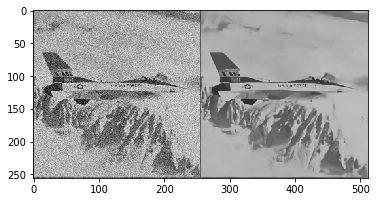

     Set12 :     07.png : 0.0100 second


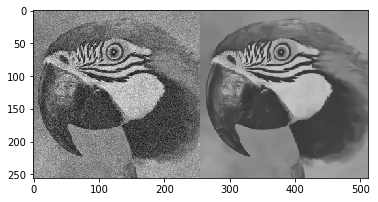

     Set12 :     08.png : 0.0389 second


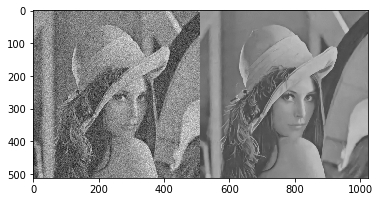

     Set12 :     09.png : 0.0484 second


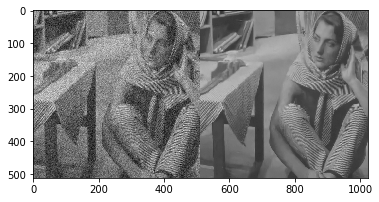

     Set12 :     10.png : 0.0379 second


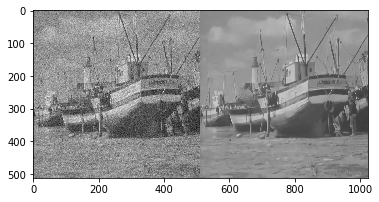

     Set12 :     11.png : 0.0329 second


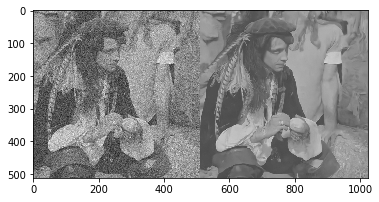

     Set12 :     12.png : 0.0379 second


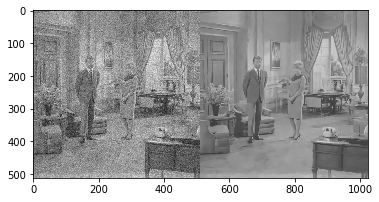

Datset: Set12      
  PSNR = 30.16dB, SSIM = 0.9241
     Set68 : test001.png : 0.0156 second


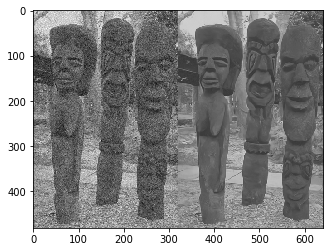

     Set68 : test002.png : 0.0156 second


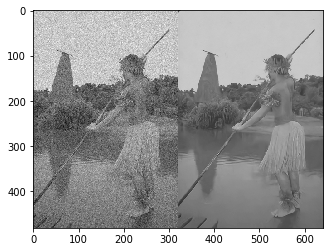

     Set68 : test003.png : 0.0156 second


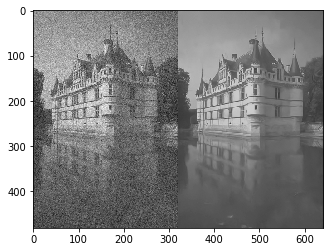

     Set68 : test004.png : 0.0156 second


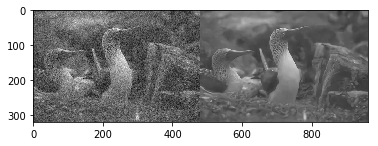

     Set68 : test005.png : 0.0156 second


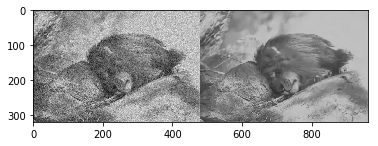

     Set68 : test006.png : 0.0312 second


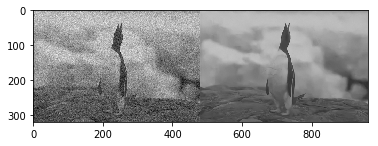

     Set68 : test007.png : 0.0312 second


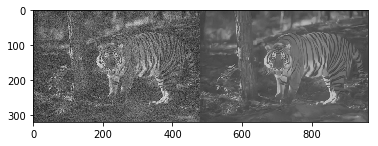

     Set68 : test008.png : 0.0312 second


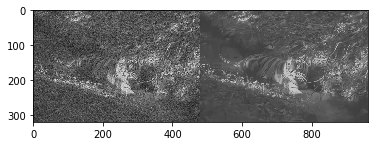

     Set68 : test009.png : 0.0312 second


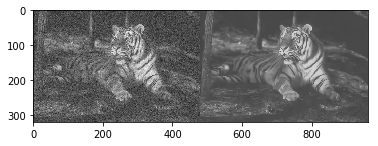

     Set68 : test010.png : 0.0156 second


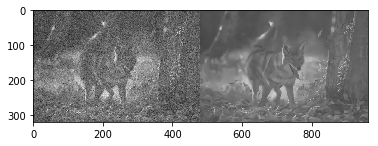

     Set68 : test011.png : 0.0312 second


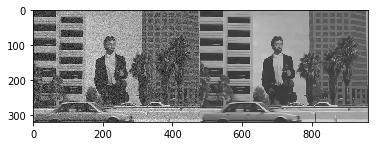

     Set68 : test012.png : 0.0312 second


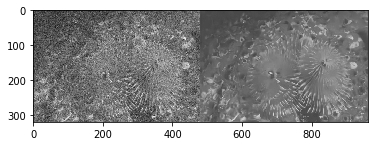

     Set68 : test013.png : 0.0313 second


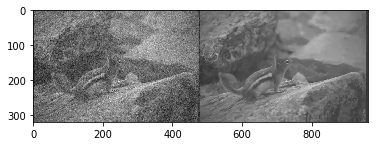

     Set68 : test014.png : 0.0156 second


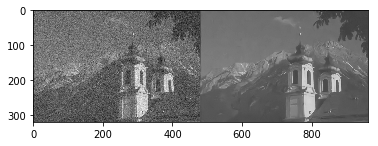

     Set68 : test015.png : 0.0156 second


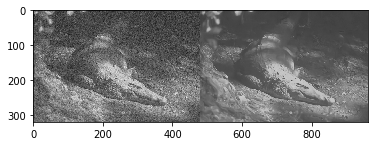

     Set68 : test016.png : 0.0156 second


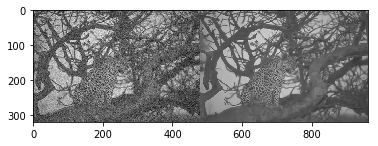

     Set68 : test017.png : 0.0312 second


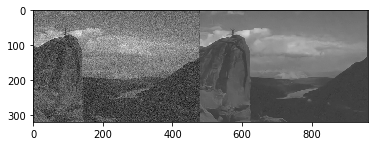

     Set68 : test018.png : 0.0312 second


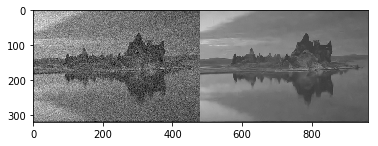

     Set68 : test019.png : 0.0312 second


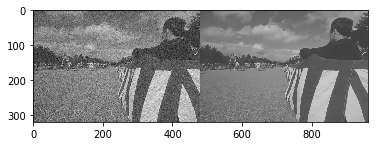

     Set68 : test020.png : 0.0312 second


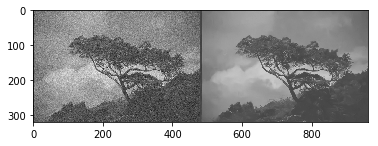

     Set68 : test021.png : 0.0312 second


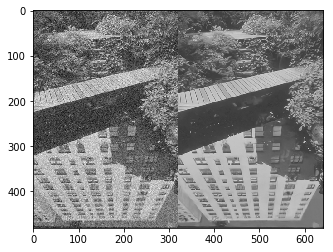

     Set68 : test022.png : 0.0156 second


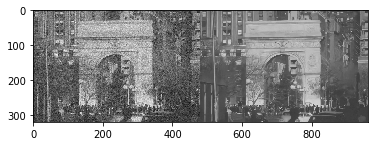

     Set68 : test023.png : 0.0156 second


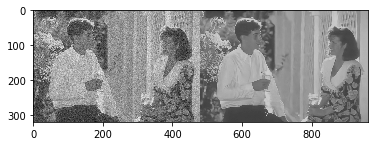

     Set68 : test024.png : 0.0156 second


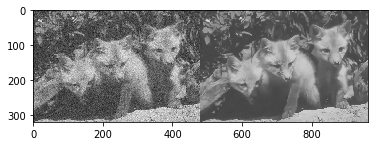

     Set68 : test025.png : 0.0156 second


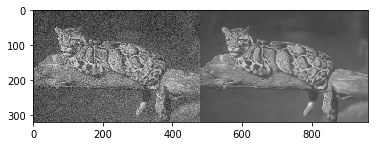

     Set68 : test026.png : 0.0156 second


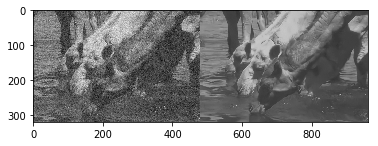

     Set68 : test027.png : 0.0313 second


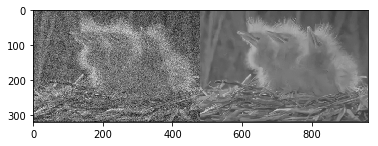

     Set68 : test028.png : 0.0312 second


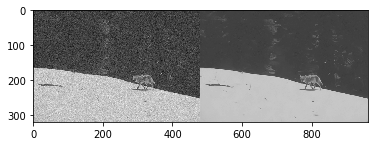

     Set68 : test029.png : 0.0156 second


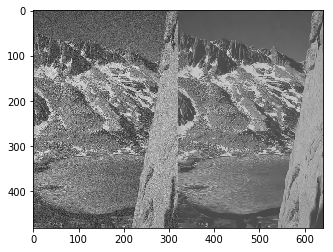

     Set68 : test030.png : 0.0312 second


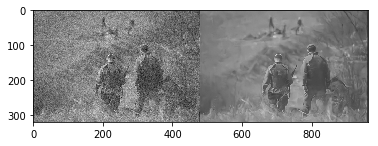

     Set68 : test031.png : 0.0312 second


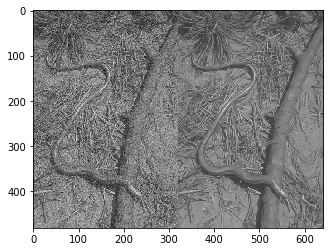

     Set68 : test032.png : 0.0312 second


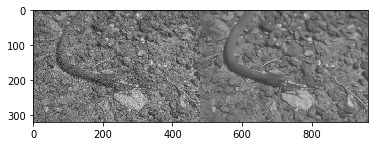

     Set68 : test033.png : 0.0156 second


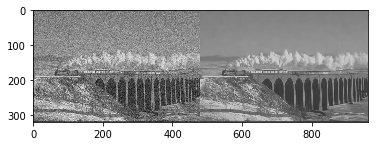

     Set68 : test034.png : 0.0156 second


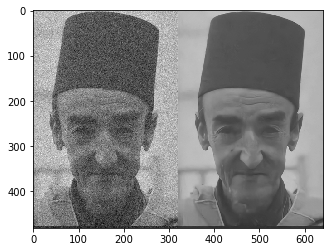

     Set68 : test035.png : 0.0312 second


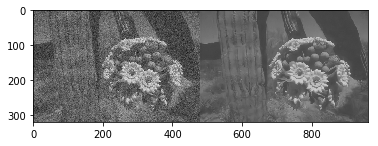

     Set68 : test036.png : 0.0312 second


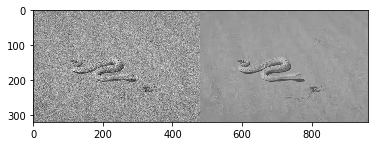

     Set68 : test037.png : 0.0312 second


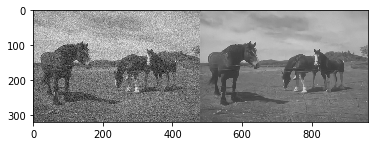

     Set68 : test038.png : 0.0313 second


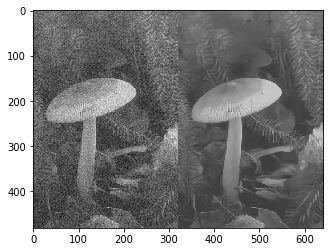

     Set68 : test039.png : 0.0156 second


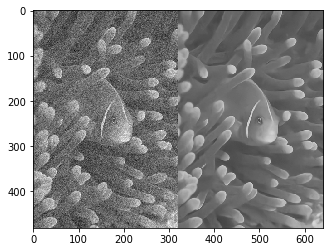

     Set68 : test040.png : 0.0312 second


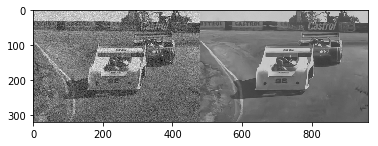

     Set68 : test041.png : 0.0312 second


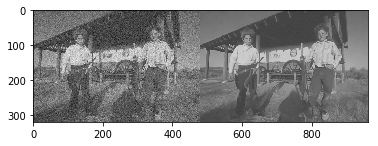

     Set68 : test042.png : 0.0312 second


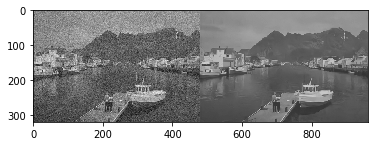

     Set68 : test043.png : 0.0312 second


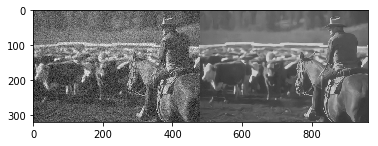

     Set68 : test044.png : 0.0156 second


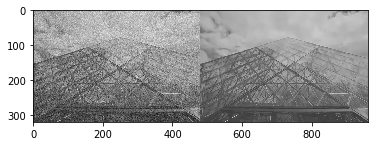

     Set68 : test045.png : 0.0312 second


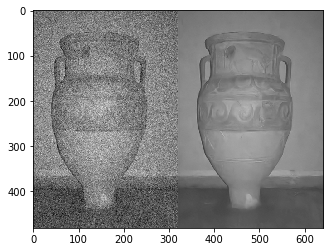

     Set68 : test046.png : 0.0312 second


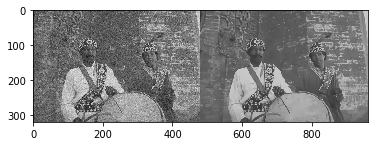

     Set68 : test047.png : 0.0312 second


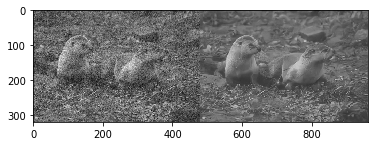

     Set68 : test048.png : 0.0313 second


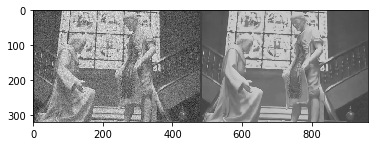

     Set68 : test049.png : 0.0156 second


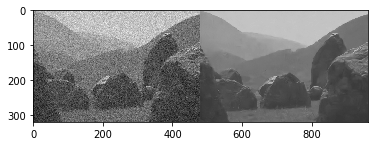

     Set68 : test050.png : 0.0313 second


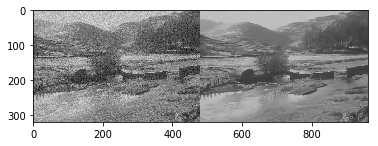

     Set68 : test051.png : 0.0156 second


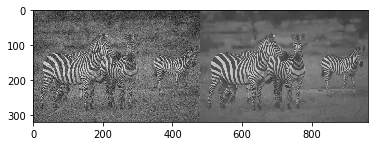

     Set68 : test052.png : 0.0312 second


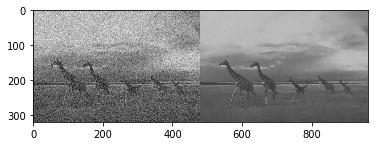

     Set68 : test053.png : 0.0312 second


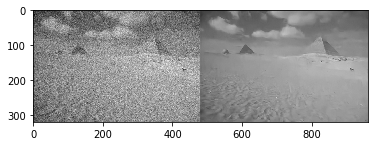

     Set68 : test054.png : 0.0312 second


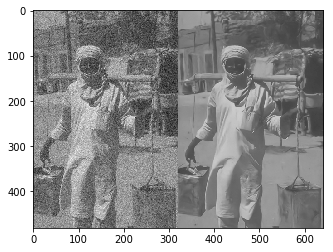

     Set68 : test055.png : 0.0312 second


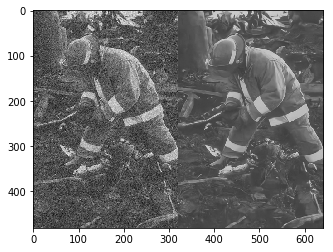

     Set68 : test056.png : 0.0312 second


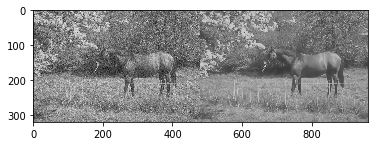

     Set68 : test057.png : 0.0312 second


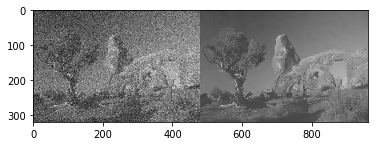

     Set68 : test058.png : 0.0156 second


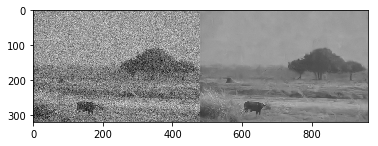

     Set68 : test059.png : 0.0312 second


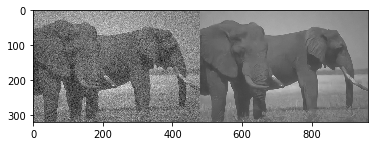

     Set68 : test060.png : 0.0156 second


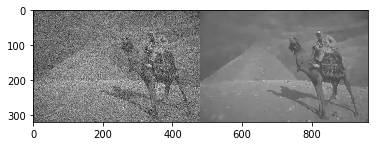

     Set68 : test061.png : 0.0312 second


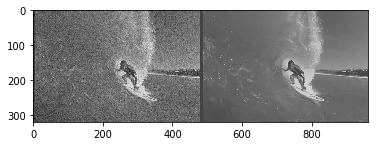

     Set68 : test062.png : 0.0156 second


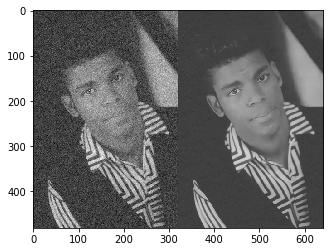

     Set68 : test063.png : 0.0156 second


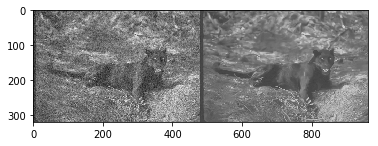

     Set68 : test064.png : 0.0313 second


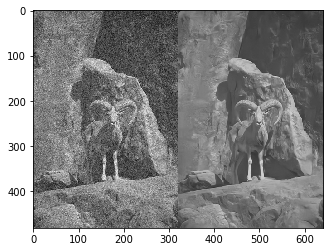

     Set68 : test065.png : 0.0156 second


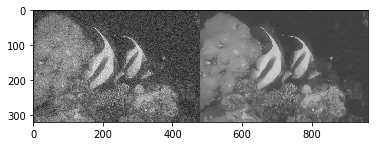

     Set68 : test066.png : 0.0312 second


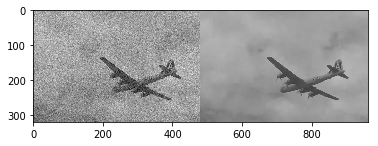

     Set68 : test067.png : 0.0156 second


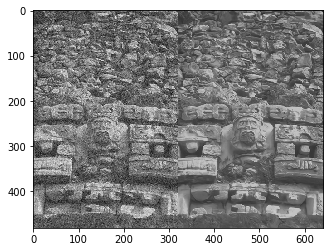

     Set68 : test068.png : 0.0312 second


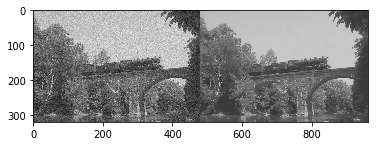

Datset: Set68      
  PSNR = 29.01dB, SSIM = 0.8951


In [16]:
set_dir = 'data/Test'
set_names = ['Set12', 'Set68']
sigma = 25
model_dir = 'models'
model_name = 'model_d25_1.pth'
result_dir = 'results'

model = torch.load(os.path.join(model_dir, model_name))

model.eval()

if torch.cuda.is_available():
    model = model.cuda()

for set_cur in set_names:

    if not os.path.exists(os.path.join(result_dir, set_cur)):
        os.mkdir(os.path.join(result_dir, set_cur))
    psnrs = []
    ssims = []

    for im in os.listdir(os.path.join(set_dir, set_cur)):
        if im.endswith(".jpg") or im.endswith(".bmp") or im.endswith(".png"):
            
            x = np.array(imread(os.path.join(set_dir, set_cur, im)), dtype=np.float32)/255.0
            np.random.seed(seed=0)  # for reproducibility
            y = x + np.random.normal(0, sigma/255.0, x.shape)  # Add Gaussian noise without clipping
            y = y.astype(np.float32)
            y_ = torch.from_numpy(y).view(1, -1, y.shape[0], y.shape[1])

            torch.cuda.synchronize()
            start_time = time.time()
            y_ = y_.cuda()
            r = model(y_)
            x_ = y_ - r  # inference
            
            x_ = x_.view(y.shape[0], y.shape[1])
            x_ = x_.cpu()
            x_ = x_.detach().numpy().astype(np.float32)
            r = r.view(y.shape[0], y.shape[1])
            r = r.cpu()
            r = r.detach().numpy().astype(np.float32)
            s = x-x_
            s = s.astype(np.float32)
            
            torch.cuda.synchronize()
            elapsed_time = time.time() - start_time
            print('%10s : %10s : %2.4f second' % (set_cur, im, elapsed_time))

            psnr_x_ = compare_psnr(x, x_)
            ssim_x_ = compare_ssim(x, x_)
            
            name, ext = os.path.splitext(im)
            show(np.hstack((y, x_)))  # show the image
            save_result(x_, path=os.path.join(result_dir, set_cur, name+'_dncnn'+ext))  # save the denoised image
            save_residual(r, path=os.path.join(result_dir, set_cur, name+'_residual'+ext))  # save the denoised image
            save_structure(s, path=os.path.join(result_dir, set_cur, name+'_structure'+ext))  # save the denoised image
            
            psnrs.append(psnr_x_)
            ssims.append(ssim_x_)
    psnr_avg = np.mean(psnrs)
    ssim_avg = np.mean(ssims)
    psnrs.append(psnr_avg)
    ssims.append(ssim_avg)

    print('Datset: {0:10s} \n  PSNR = {1:2.2f}dB, SSIM = {2:1.4f}'.format(set_cur, psnr_avg, ssim_avg))

## Test SNet

     Set12 :     01.png : 0.0101 second


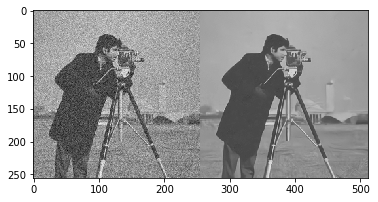

     Set12 :     02.png : 0.0129 second


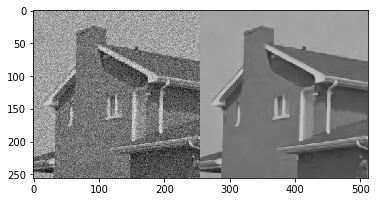

     Set12 :     03.png : 0.0140 second


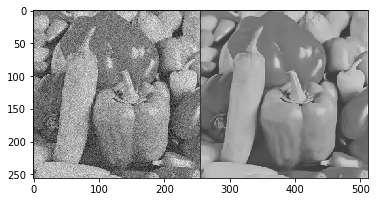

     Set12 :     04.png : 0.0150 second


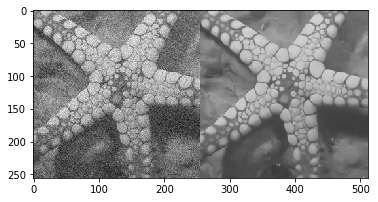

     Set12 :     05.png : 0.0130 second


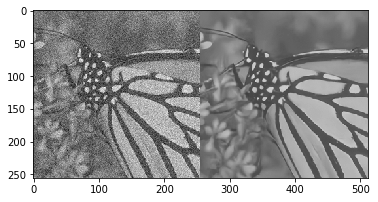

     Set12 :     06.png : 0.0130 second


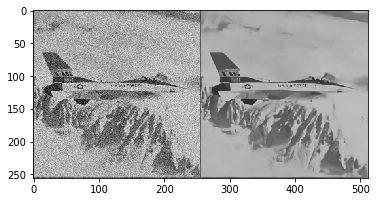

     Set12 :     07.png : 0.0012 second


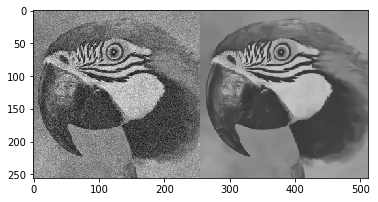

     Set12 :     08.png : 0.0550 second


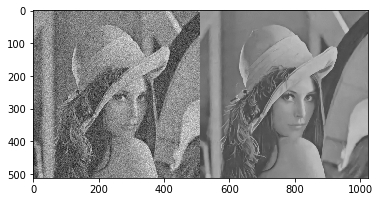

     Set12 :     09.png : 0.0614 second


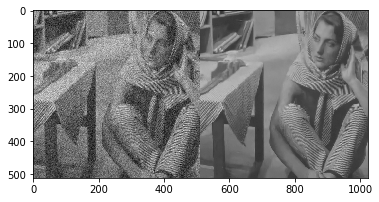

     Set12 :     10.png : 0.0536 second


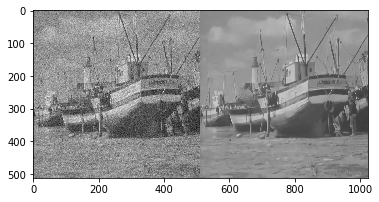

     Set12 :     11.png : 0.0597 second


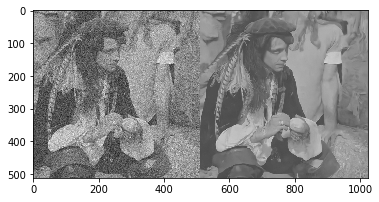

     Set12 :     12.png : 0.0489 second


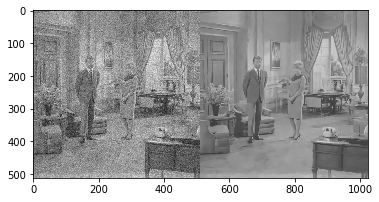

Datset: Set12      
  PSNR = 30.16dB, SSIM = 0.9241
     Set68 : test001.png : 0.0329 second


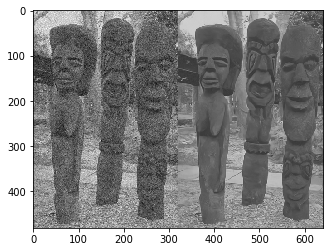

     Set68 : test002.png : 0.0339 second


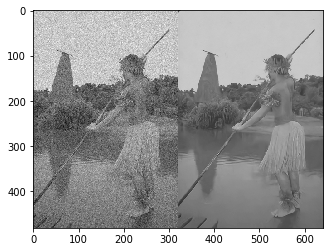

     Set68 : test003.png : 0.0312 second


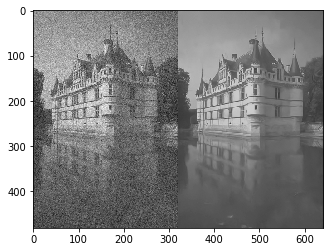

     Set68 : test004.png : 0.0310 second


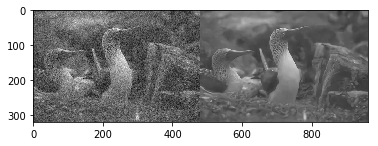

     Set68 : test005.png : 0.0455 second


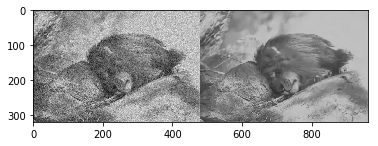

     Set68 : test006.png : 0.0312 second


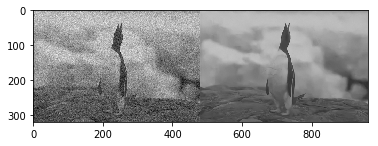

     Set68 : test007.png : 0.0349 second


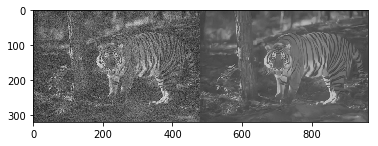

     Set68 : test008.png : 0.0329 second


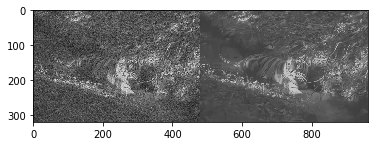

     Set68 : test009.png : 0.0249 second


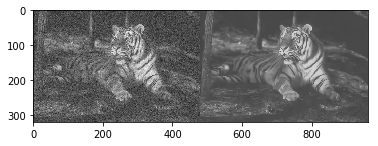

     Set68 : test010.png : 0.0323 second


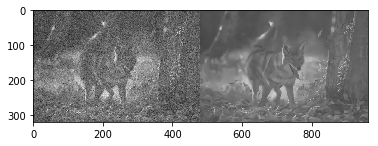

     Set68 : test011.png : 0.0312 second


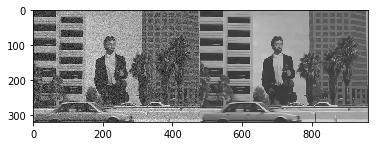

     Set68 : test012.png : 0.0349 second


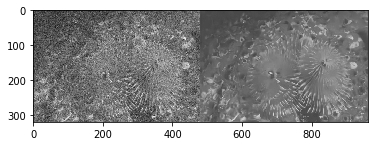

     Set68 : test013.png : 0.0364 second


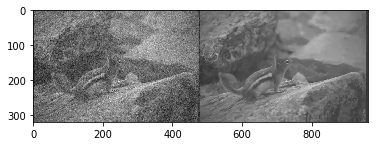

     Set68 : test014.png : 0.0474 second


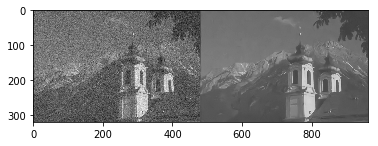

     Set68 : test015.png : 0.0312 second


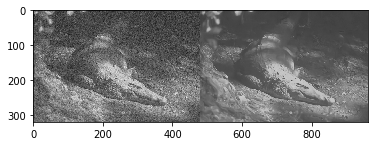

     Set68 : test016.png : 0.0322 second


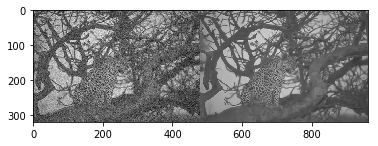

     Set68 : test017.png : 0.0312 second


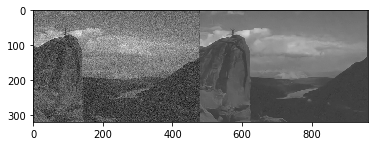

     Set68 : test018.png : 0.0227 second


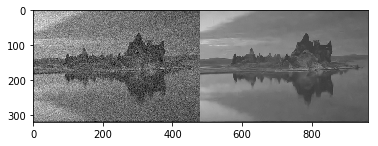

     Set68 : test019.png : 0.0394 second


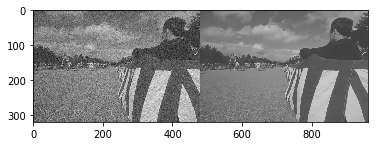

     Set68 : test020.png : 0.0480 second


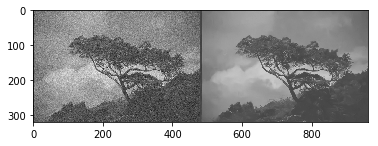

     Set68 : test021.png : 0.0339 second


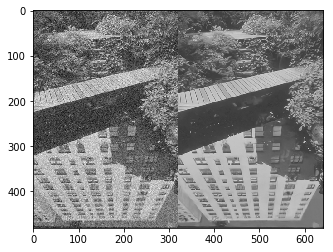

     Set68 : test022.png : 0.0312 second


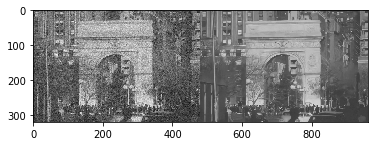

     Set68 : test023.png : 0.0331 second


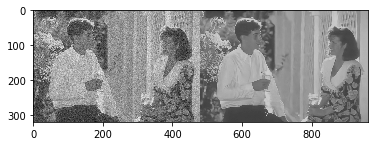

     Set68 : test024.png : 0.0406 second


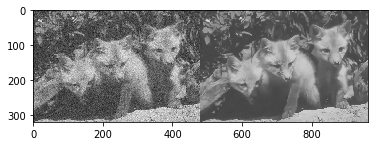

     Set68 : test025.png : 0.0312 second


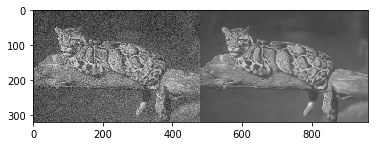

     Set68 : test026.png : 0.0352 second


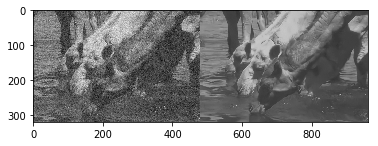

     Set68 : test027.png : 0.0221 second


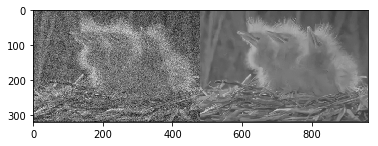

     Set68 : test028.png : 0.0242 second


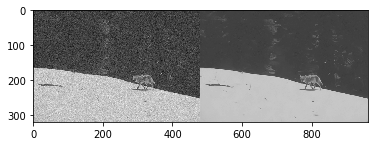

     Set68 : test029.png : 0.0424 second


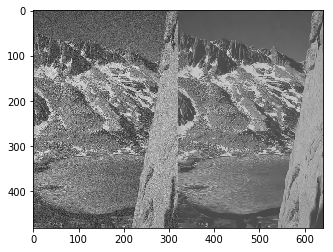

     Set68 : test030.png : 0.0312 second


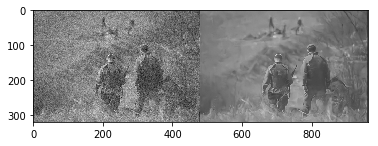

     Set68 : test031.png : 0.0312 second


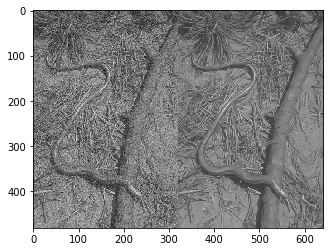

     Set68 : test032.png : 0.0339 second


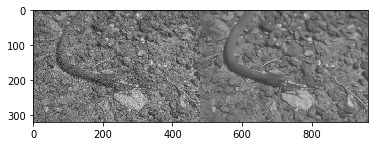

     Set68 : test033.png : 0.0314 second


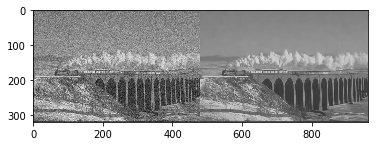

     Set68 : test034.png : 0.0408 second


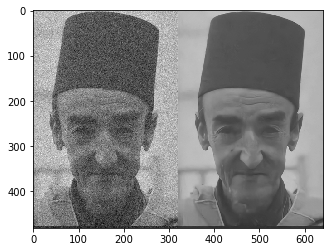

     Set68 : test035.png : 0.0374 second


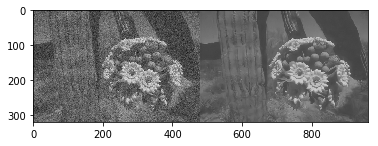

     Set68 : test036.png : 0.0227 second


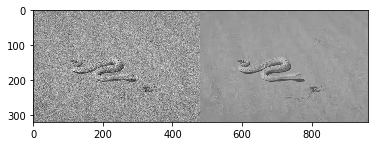

     Set68 : test037.png : 0.0481 second


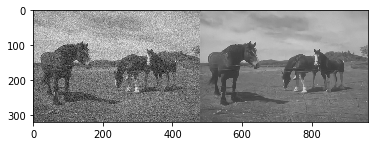

     Set68 : test038.png : 0.0477 second


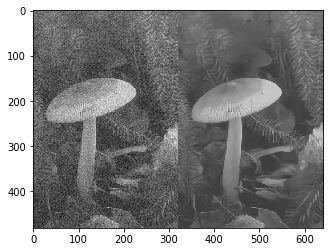

     Set68 : test039.png : 0.0351 second


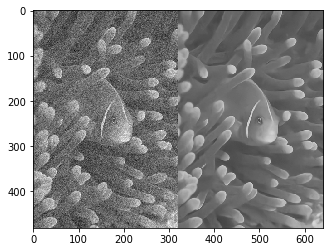

     Set68 : test040.png : 0.0312 second


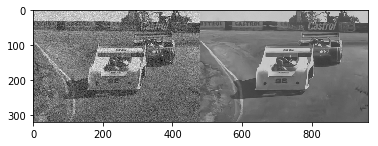

     Set68 : test041.png : 0.0222 second


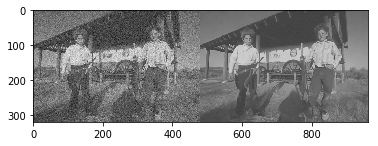

     Set68 : test042.png : 0.0312 second


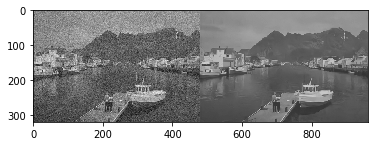

     Set68 : test043.png : 0.0330 second


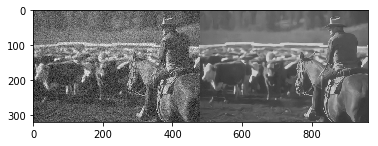

     Set68 : test044.png : 0.0465 second


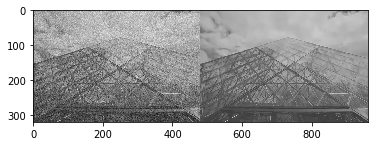

     Set68 : test045.png : 0.0326 second


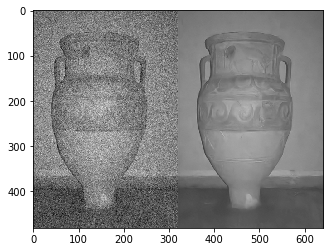

     Set68 : test046.png : 0.0417 second


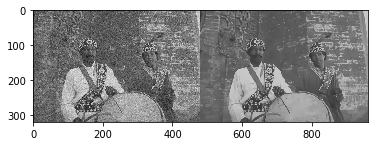

     Set68 : test047.png : 0.0312 second


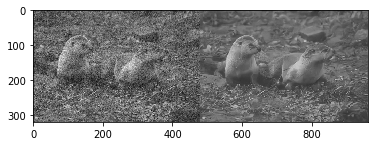

     Set68 : test048.png : 0.0400 second


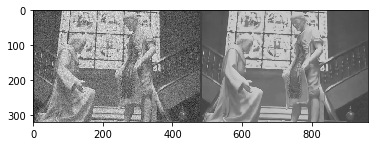

     Set68 : test049.png : 0.0303 second


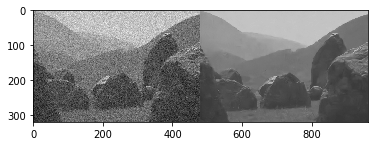

     Set68 : test050.png : 0.0468 second


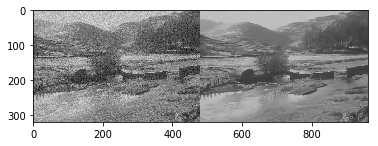

     Set68 : test051.png : 0.0341 second


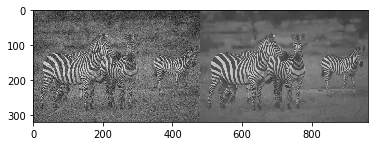

     Set68 : test052.png : 0.0312 second


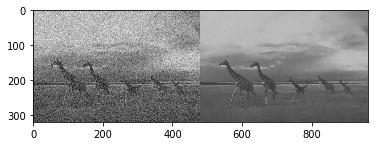

     Set68 : test053.png : 0.0345 second


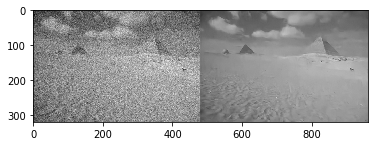

     Set68 : test054.png : 0.0379 second


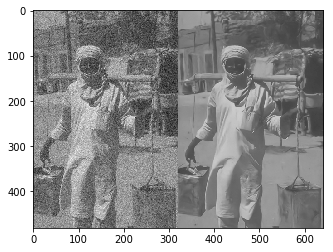

     Set68 : test055.png : 0.0362 second


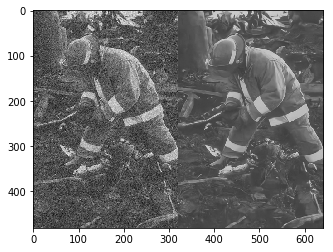

     Set68 : test056.png : 0.0349 second


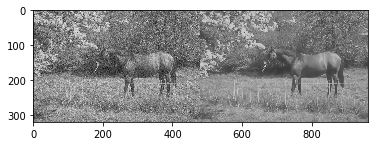

     Set68 : test057.png : 0.0302 second


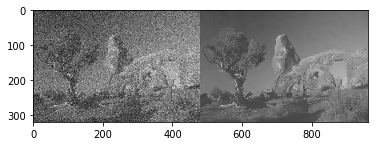

     Set68 : test058.png : 0.0312 second


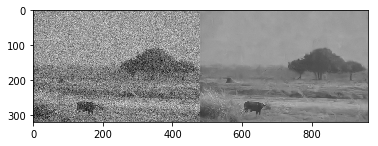

     Set68 : test059.png : 0.0279 second


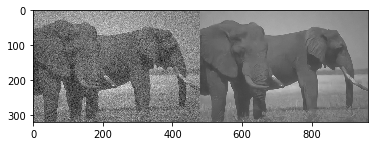

     Set68 : test060.png : 0.0349 second


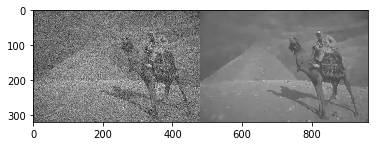

     Set68 : test061.png : 0.0435 second


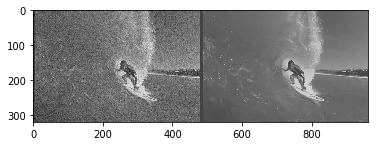

     Set68 : test062.png : 0.0222 second


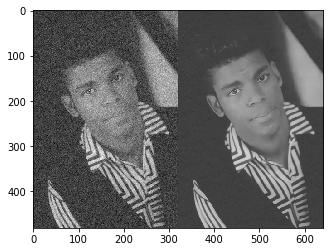

     Set68 : test063.png : 0.0280 second


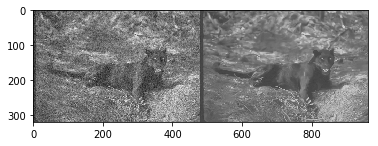

     Set68 : test064.png : 0.0405 second


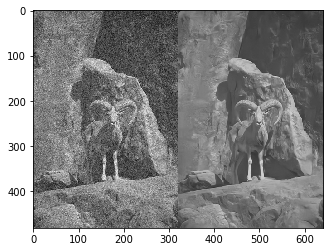

     Set68 : test065.png : 0.0237 second


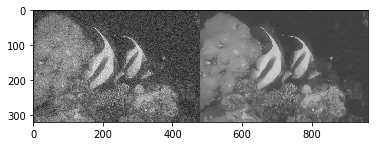

     Set68 : test066.png : 0.0381 second


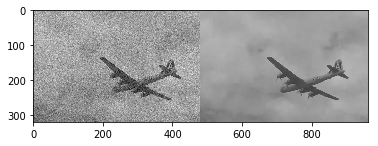

     Set68 : test067.png : 0.0322 second


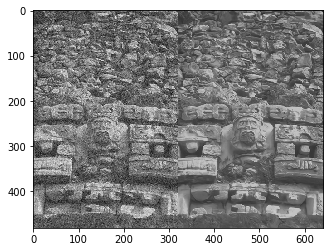

     Set68 : test068.png : 0.0263 second


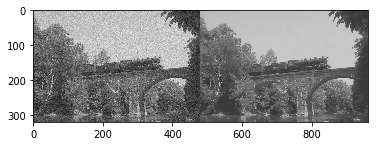

Datset: Set68      
  PSNR = 29.01dB, SSIM = 0.8951


In [6]:
set_dir = 'data/Test'
set_names = ['Set12', 'Set68']
sigma = 25
model_dir = 'models'
d_model_name = 'model_d25_1.pth'
s_model_name = 'model2_s25_1.pth'
result_dir = 'results'

DNet_model = torch.load(os.path.join(model_dir, d_model_name))
SNet_model = torch.load(os.path.join(model_dir, s_model_name))

DNet_model.eval()
SNet_model.eval()

if torch.cuda.is_available():
    DNet_model = DNet_model.cuda()
    SNet_model = SNet_model.cuda()

for set_cur in set_names:

    if not os.path.exists(os.path.join(result_dir, set_cur)):
        os.mkdir(os.path.join(result_dir, set_cur))
    psnrs = []
    ssims = []

    for im in os.listdir(os.path.join(set_dir, set_cur)):
        if im.endswith(".jpg") or im.endswith(".bmp") or im.endswith(".png"):
            
            x = np.array(imread(os.path.join(set_dir, set_cur, im)), dtype=np.float32)/255.0
            np.random.seed(seed=0)  # for reproducibility
            y = x + np.random.normal(0, sigma/255.0, x.shape)  # Add Gaussian noise without clipping
            y = y.astype(np.float32)
            y_ = torch.from_numpy(y).view(1, -1, y.shape[0], y.shape[1])

            torch.cuda.synchronize()
            start_time = time.time()
            y_ = y_.cuda()
            r = DNet_model(y_)
            x_ = y_ - r  # inference
            
            s = SNet_model(r, x_)
            
            x_ = x_.view(y.shape[0], y.shape[1])
            x_ = x_.cpu()
            x_ = x_.detach().numpy().astype(np.float32)
            r = r.view(y.shape[0], y.shape[1])
            r = r.cpu()
            r = r.detach().numpy().astype(np.float32)
            s = s.view(y.shape[0], y.shape[1])
            s = s.cpu()
            s = s.detach().numpy().astype(np.float32)
            
            torch.cuda.synchronize()
            elapsed_time = time.time() - start_time
            print('%10s : %10s : %2.4f second' % (set_cur, im, elapsed_time))

            psnr_x_ = compare_psnr(x, x_)
            ssim_x_ = compare_ssim(x, x_)
            
            name, ext = os.path.splitext(im)
            show(np.hstack((y, x_)))  # show the image
            save_result(x_, path=os.path.join(result_dir, set_cur, name+'_dncnn'+ext))  # save the denoised image
            save_residual(r, path=os.path.join(result_dir, set_cur, name+'_residual'+ext))  # save the denoised image
            save_structure(s, path=os.path.join(result_dir, set_cur, name+'_structure'+ext))  # save the denoised image
            
            psnrs.append(psnr_x_)
            ssims.append(ssim_x_)
    psnr_avg = np.mean(psnrs)
    ssim_avg = np.mean(ssims)
    psnrs.append(psnr_avg)
    ssims.append(ssim_avg)

    print('Datset: {0:10s} \n  PSNR = {1:2.2f}dB, SSIM = {2:1.4f}'.format(set_cur, psnr_avg, ssim_avg))